Malay news
- https://www.astroawani.com/search?q=kpdnhep
- https://www.freemalaysiatoday.com/?s=kpdnhep
- https://www.bharian.com.my/search?keywords=kpdnhep&page=10
- https://www.hmetro.com.my/search?keywords=kpdnhep&page=1


### Imports

In [2]:
# Imports
import snscrape.modules.twitter as sntwitter
import pandas as pd
import tweepy
import pickle
import os
import numpy as np
import json
import malaya
from tqdm.notebook import tqdm
import os
import pandas as pd
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_colwidth', -1)

import preprocessor as p
p.set_options(p.OPT.URL, p.OPT.MENTION)
import re
import json
import spacy
import glob

In [28]:
from IPython.display import display, HTML
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import matplotlib.pyplot as plt
from nltk import word_tokenize

In [4]:
nlp = spacy.load('en_core_web_lg')

### Load data

In [ ]:
total = 0
dfAll = pd.DataFrame()
for file in glob.glob("data/*.crawl"):
    with open(file) as f:
        data = json.load(f)
        df = pd.DataFrame(data)
        dfAll = dfAll.append(df)
        print(file, len(df))
        total+= len(df)
        
print("Total: ", total)        

In [ ]:
dfAll.reset_index(inplace = True, drop = True)

In [ ]:
dfAll.info()

In [ ]:
dfAll['Token Counts'] = dfAll.text.apply(lambda text :  len(nlp(text)))

In [ ]:
dfAll['Token Counts'].sum()

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

# texts=["dog cat fish","dog cat cat","fish bird", 'bird']
texts = dfAll['text']
cv = CountVectorizer(ngram_range = (1,1))
cv_fit=cv.fit_transform(texts)

fre_count_df = pd.DataFrame()
fre_count_df['Word'] = cv.get_feature_names()
fre_count_df['Frequency'] = cv_fit.toarray().sum(axis=0)


In [ ]:
fre_count_df.info()

### Preprocessing

In [ ]:
sentence = dfAll.text.iloc[5]
sentence

In [ ]:
doc = nlp(sentence)
for word in doc:
    print(word.lemma_, end = " ")


In [ ]:
" ".join([word.lemma_ for word in doc])

In [ ]:
dfAll['text Pre'] = dfAll.text.apply(lambda text : " ".join(word.lemma_ for word in nlp(text)))

In [ ]:
dfAll['text Pre'] = dfAll['text Pre'].str.replace("-PRON-", "")

In [ ]:
dfAll['text Pre'] = dfAll['text Pre'].str.strip()

In [ ]:
# dfAll.to_pickle("dfAll-normalize.pickle")

### Load preprocessed DataFrame

In [5]:
 dfAll = pd.read_pickle("dfAll-normalize.pickle")

In [6]:
dfAll.drop(index  = dfAll[dfAll.text == ""].index, inplace = True)

In [7]:
dfAll.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5259 entries, 0 to 5583
Data columns (total 11 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   title      5259 non-null   object
 1   url        5259 non-null   object
 2   authors    5259 non-null   object
 3   top-image  5259 non-null   object
 4   text       5259 non-null   object
 5   keyword    5259 non-null   object
 6   summary    5259 non-null   object
 7   news       5259 non-null   object
 8   date       5259 non-null   object
 9   language   5259 non-null   object
 10  text Pre   5259 non-null   object
dtypes: object(11)
memory usage: 493.0+ KB


#### Stopwords

In [8]:
dfAll['text Pre'] = dfAll['text Pre'].str.lower()

In [9]:
#remove hashtag, links, @/mention
%%time
def preprocess_Text(Text):
    clean1 = p.clean(Text)
    clean1 = clean1.replace('&amp;', "&")
    return clean1
dfAll['text Pre'] = dfAll['text Pre'].apply(preprocess_Text)


UsageError: Line magic function `%%time` not found.


In [10]:
%%time
def remove_punc(Text):
    # initializing punctuations string
    punc = '''!()-[]{};:'"\,<>./?@#$%^&*_~'''
    
    # Using loop + punctuation string
    for ele in Text:
        if ele in punc:
            Text = Text.replace(ele, " ")
    return Text

#remove punc
dfAll['text Pre'] = dfAll['text Pre'].apply(remove_punc) 

Wall time: 2.03 s


In [11]:
%%time
import spacy

nlp = spacy.load('en_core_web_sm')
sw_eng = nlp.Defaults.stop_words

sw_eng = list(sw_eng)
sw_eng = sw_eng + ['don','ve', 'be', 'etc', 'do', 'let', 'this', 'said', "domestic", "trade"
                  "domestic trade"    , "consumer affair", "consumer affairs", "trade consumer" , "facebook", "twitter", 
                   "affairs ministry", "kpdnhep" , "twitter", "telegram", "instagram", "subscribe" ,
                   "datuk seri", "affair",  "affairs", "ministry kpdnhep",
                   "kuala lumpur", "telegram channel", "minister datuk",
                    "alexander nanta", "alexander", "datuk seri", "nanta linggi" , "khairy jamaluddin",
                   "trade consumer" , "story update", "tan sri" , "sdn bhd", "minister datuk", 
                   "consumer ministry", "noor hisham", "datuk seri	", "ministry trade",
                    "kpdnhep gov" , "trade consumer" , "nanta linggi", "khairy jamaluddin", "minister khairy"
                   
                  ]
# sw_eng = sw_eng + ['don','ve', 'be', 'etc', 'do', 'let', 'this']
print("Total stopword: ", len(sw_eng))

def remove_stop_words(text):
    for word in sw_eng:
        text = re.sub(' ' + word + ' '," ", text )
    return text

def remove_stop_words2(text):
    word_tokens = word_tokenize(text)
    filtered_sentence = [w for w in word_tokens if not w.lower() in sw_eng]
    return " ".join(filtered_sentence)
    

dfAll['text Pre'] = dfAll['text Pre'].apply(remove_stop_words)
dfAll['text Pre'] = dfAll['text Pre'].apply(remove_stop_words2)

Total stopword:  373


NameError: name 'word_tokenize' is not defined

### Frequency calculation

In [12]:
from sklearn.feature_extraction.text import CountVectorizer

# texts=["dog cat fish","dog cat cat","fish bird", 'bird']
texts = dfAll['text Pre']
cv = CountVectorizer(ngram_range = (1,1))
cv_fit=cv.fit_transform(texts)

# print(cv.get_feature_names())
# print(cv_fit.toarray())

In [13]:
fre_count_df = pd.DataFrame()
fre_count_df['Word'] = cv.get_feature_names()
fre_count_df['Frequency'] = cv_fit.toarray().sum(axis=0)

In [14]:
fre_count_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11841 entries, 0 to 11840
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   Word       11841 non-null  object
 1   Frequency  11841 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 185.1+ KB


In [15]:
fre_count_df.sort_values(by='Frequency', ascending = False)[:100].reset_index(drop=True)

,Word,Frequency
0,allow,8959
1,price,7614
2,19,7092
3,covid,6851
4,ministry,6826
5,government,6336
6,premise,5893
7,malaysia,5672
8,state,5102
9,activity,4771


### News counts by months

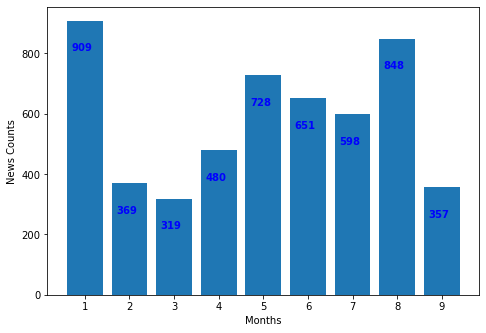

In [16]:
import matplotlib.pyplot as plt
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])

dfAll.date = pd.to_datetime(dfAll.date)
dfAll['Month'] = dfAll.date.dt.month

val = dfAll.date.dt.month.value_counts().sort_index()

x = val.index
y = val.values
ax.bar(x,y)
ax.set_xticks(val.index)
ax.set_xlabel("Months")
ax.set_ylabel("News Counts")

for i, v in enumerate(y):
    ax.text(i + 0.7, v - 100 , str(v), color='blue', fontweight='bold')
    
plt.show()

### Topic Modelling

In [17]:
# Author: Olivier Grisel <olivier.grisel@ensta.org>
#         Lars Buitinck
#         Chyi-Kwei Yau <chyikwei.yau@gmail.com>
# License: BSD 3 clause

from time import time
import matplotlib.pyplot as plt

from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.decomposition import NMF, LatentDirichletAllocation
from sklearn.datasets import fetch_20newsgroups

In [18]:
def plot_top_words(model, feature_names, n_top_words, title):
    fig, axes = plt.subplots(1, 5, figsize=(30, 15), sharex=True)
    axes = axes.flatten()
    for topic_idx, topic in enumerate(model.components_):
        top_features_ind = topic.argsort()[:-n_top_words - 1:-1]
        top_features = [feature_names[i] for i in top_features_ind]
        weights = topic[top_features_ind]

        ax = axes[topic_idx]
        ax.barh(top_features, weights, height=0.7)
        ax.set_title(f'Topic {topic_idx +1}',
                     fontdict={'fontsize': 30})
        ax.invert_yaxis()
        ax.tick_params(axis='both', which='major', labelsize=20)
        for i in 'top right left'.split():
            ax.spines[i].set_visible(False)
        fig.suptitle(title, fontsize=40)

    plt.subplots_adjust(top=0.90, bottom=0.05, wspace=0.90, hspace=0.3)
    plt.show()


# Load the 20 newsgroups dataset and vectorize it. We use a few heuristics
# to filter out useless terms early on: the posts are stripped of headers,
# footers and quoted replies, and common English words, words occurring in
# only one document or in at least 95% of the documents are removed.

In [19]:
n_samples = dfAll.count()[0]
n_features = 5000
n_components = 5
n_top_words = 20

t0 = time()
print("Loading dataset...")
data_samples = dfAll.text
print("done in %0.3fs." % (time() - t0))

Loading dataset...
done in 0.004s.


In [20]:
# Use tf-idf features for NMF.
print("Extracting tf-idf features for NMF...")
tfidf_vectorizer = TfidfVectorizer(max_df=0.95, min_df=2,
                                   max_features=n_features,
                                   stop_words='english')
t0 = time()
tfidf = tfidf_vectorizer.fit_transform(data_samples)
print("done in %0.3fs." % (time() - t0))

# Use tf (raw term count) features for LDA.
print("Extracting tf features for LDA...")
tf_vectorizer = CountVectorizer(max_df=0.95, min_df=2,
                                max_features=n_features,
                                stop_words='english')
t0 = time()
tf = tf_vectorizer.fit_transform(data_samples)
print("done in %0.3fs." % (time() - t0))
print()

Extracting tf-idf features for NMF...
done in 3.835s.
Extracting tf features for LDA...
done in 3.874s.



Fitting the NMF model (Frobenius norm) with tf-idf features, n_samples=5259 and n_features=5000...
done in 1.978s.


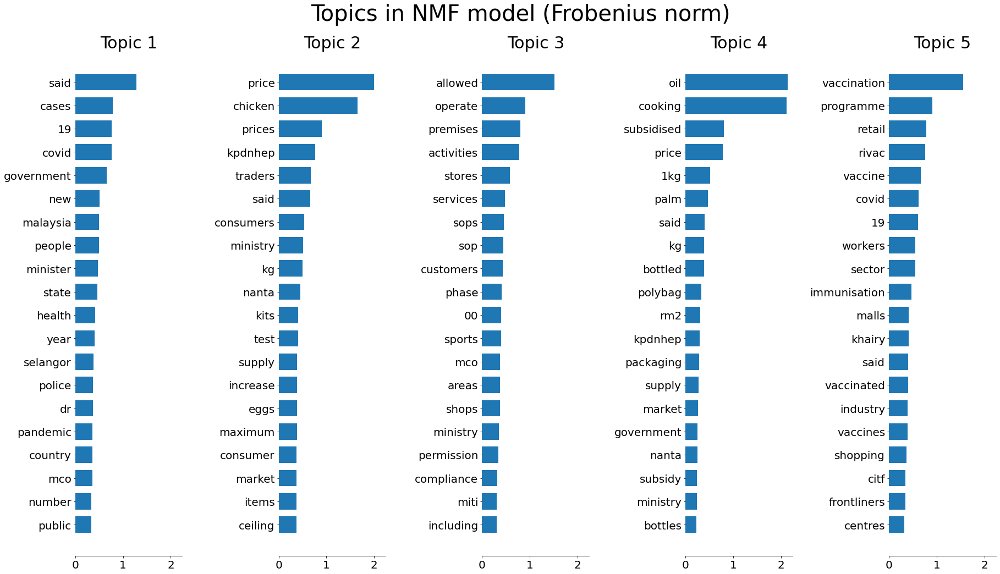

In [21]:
# Fit the NMF model
print("Fitting the NMF model (Frobenius norm) with tf-idf features, "
      "n_samples=%d and n_features=%d..."
      % (n_samples, n_features))
t0 = time()
nmf = NMF(n_components=n_components, random_state=1,
          alpha=.1, l1_ratio=.5).fit(tfidf)
print("done in %0.3fs." % (time() - t0))


tfidf_feature_names = tfidf_vectorizer.get_feature_names()
plot_top_words(nmf, tfidf_feature_names, n_top_words,
               'Topics in NMF model (Frobenius norm)')



 Fitting the NMF model (generalized Kullback-Leibler divergence) with tf-idf features, n_samples=5259 and n_features=5000...
done in 17.372s.


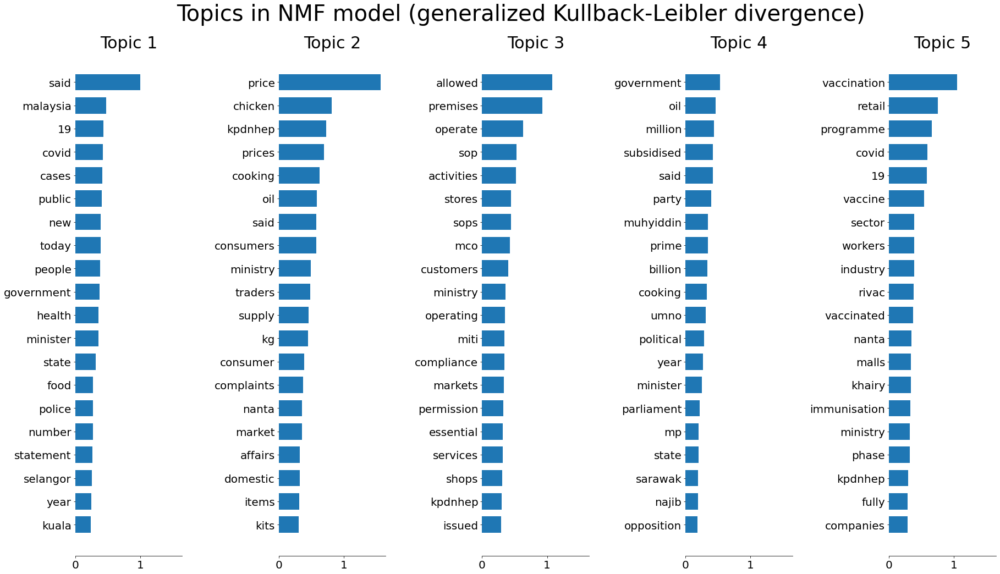

In [22]:
# Fit the NMF model
print('\n' * 2, "Fitting the NMF model (generalized Kullback-Leibler "
      "divergence) with tf-idf features, n_samples=%d and n_features=%d..."
      % (n_samples, n_features))
t0 = time()
nmf2 = NMF(n_components=n_components, random_state=1,
          beta_loss='kullback-leibler', solver='mu', max_iter=1000, alpha=.1,
          l1_ratio=.5).fit(tfidf)
print("done in %0.3fs." % (time() - t0))

tfidf_feature_names = tfidf_vectorizer.get_feature_names()
plot_top_words(nmf2, tfidf_feature_names, n_top_words,
               'Topics in NMF model (generalized Kullback-Leibler divergence)')



 Fitting LDA models with tf features, n_samples=5259 and n_features=5000...
done in 27.217s.


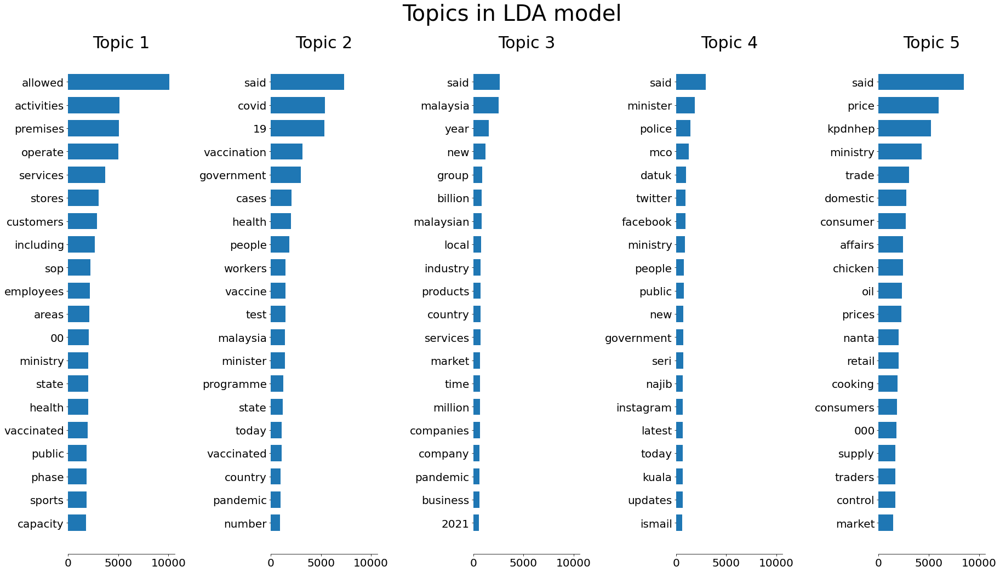

In [23]:
# Fit the LDA model
print('\n' * 2, "Fitting LDA models with tf features, "
      "n_samples=%d and n_features=%d..."
      % (n_samples, n_features))
lda = LatentDirichletAllocation(n_components=n_components, max_iter=5,
                                learning_method='online',
                                learning_offset=50.,
                                random_state=0)
t0 = time()
lda.fit(tf)
print("done in %0.3fs." % (time() - t0))

tf_feature_names = tf_vectorizer.get_feature_names()
plot_top_words(lda, tf_feature_names, n_top_words, 'Topics in LDA model')

### Topic Modelling result analysis

In [24]:
def draw_word_cloud_frequency_df(dfQ, n_grams):
    
    #Calculate Word Frequency
    texts = dfQ
    cv = CountVectorizer(ngram_range = (n_grams,n_grams))
    cv_fit=cv.fit_transform(texts)
    #Create a Dataframe form the word frequency
    fre_count_df = pd.DataFrame()
    fre_count_df['Word'] = cv.get_feature_names()
    fre_count_df['Frequency'] = cv_fit.toarray().sum(axis=0)
    #plot Word Cloud
    wordcloud = WordCloud(max_font_size=200, max_words=75, collocation_threshold = 30 ,
                          font_step=2, width= 800, height=400, background_color="white").generate_from_frequencies(fre_count_df.set_index('Word').to_dict()['Frequency'])
    plt.figure(dpi=300)
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()
    
    #Show Top 40 highest frequency
    display(HTML(fre_count_df.sort_values(by='Frequency', ascending = False)[:40].reset_index(drop=True).to_html()))

In [25]:
# Grab the highest probability words per topic
for index in range(0,5):
    print(f"TOP 20 words for topic {index+1}")
    single_topic = nmf.components_[index]

    top_tens_word = single_topic.argsort()[-20:]
    top_words_text = ''
    listWord = []
    for inx in top_tens_word:
        print(f"{tfidf_vectorizer.get_feature_names()[inx]} ({nmf.components_[0][inx]}) ", end = ' ')
        top_words_text += ' ' + cv.get_feature_names()[inx]
    print("\n\n")
    

TOP 20 words for topic 1
public (0.3319149289838507)  number (0.33987174950102633)  mco (0.35346732093826216)  country (0.3565463314190234)  pandemic (0.3635105489157162)  dr (0.36685534134864045)  police (0.36710753048832706)  selangor (0.3813600850333089)  year (0.40042400589923144)  health (0.41852863542518687)  state (0.45909933372225825)  minister (0.4749994651207916)  people (0.4962196379235438)  malaysia (0.5003122960056807)  new (0.5121574193137034)  government (0.6532885692496869)  covid (0.7644555375946565)  19 (0.7653117115389465)  cases (0.7904712572075753)  said (1.27590727798038)  


TOP 20 words for topic 2
ceiling (0.0)  items (0.036123648259774904)  market (0.09442542709434455)  consumer (0.15370732278863733)  maximum (0.0)  eggs (0.0)  increase (0.09946683308296737)  supply (0.17266542255243733)  test (0.0991274204348826)  kits (0.02902941411129818)  nanta (0.006421561233340896)  kg (0.0)  ministry (0.24857071199856193)  consumers (0.14164554621388212)  said (1.275907

In [26]:
topics = nmf.transform(tfidf)
dfAll['Topic'] = topics.argmax(axis = 1)

========================topic 1=========================
TOP 20 words for topic 5
public (0.3319149289838507)  number (0.33987174950102633)  mco (0.35346732093826216)  country (0.3565463314190234)  pandemic (0.3635105489157162)  dr (0.36685534134864045)  police (0.36710753048832706)  selangor (0.3813600850333089)  year (0.40042400589923144)  health (0.41852863542518687)  state (0.45909933372225825)  minister (0.4749994651207916)  people (0.4962196379235438)  malaysia (0.5003122960056807)  new (0.5121574193137034)  government (0.6532885692496869)  covid (0.7644555375946565)  19 (0.7653117115389465)  cases (0.7904712572075753)  said (1.27590727798038)  




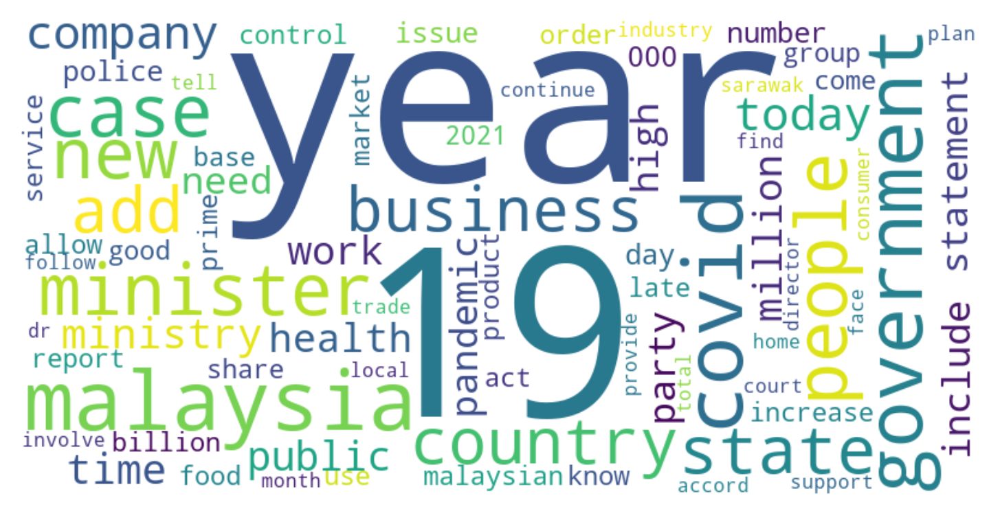

,Word,Frequency
0,year,3431
1,19,3373
2,malaysia,3347
3,covid,3252
4,government,2989
5,minister,2393
6,case,2362
7,people,2358
8,new,2311
9,state,2080


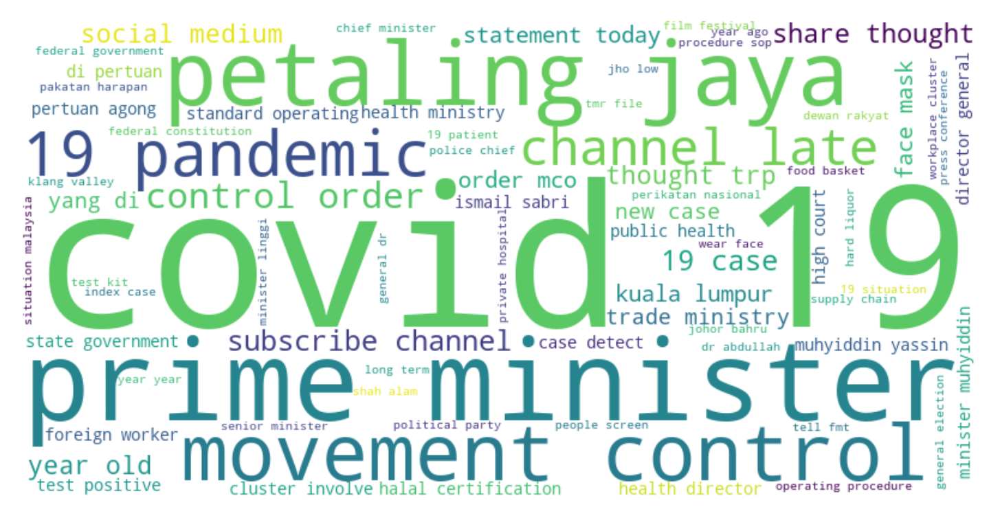

,Word,Frequency
0,covid 19,3132
1,prime minister,960
2,petaling jaya,578
3,movement control,530
4,19 pandemic,507
5,channel late,500
6,control order,500
7,subscribe channel,380
8,19 case,378
9,share thought,370


========================topic 2=========================
TOP 20 words for topic 5
ceiling (0.0)  items (0.036123648259774904)  market (0.09442542709434455)  consumer (0.15370732278863733)  maximum (0.0)  eggs (0.0)  increase (0.09946683308296737)  supply (0.17266542255243733)  test (0.0991274204348826)  kits (0.02902941411129818)  nanta (0.006421561233340896)  kg (0.0)  ministry (0.24857071199856193)  consumers (0.14164554621388212)  said (1.27590727798038)  traders (0.0)  kpdnhep (0.14653046127279995)  prices (0.0)  chicken (0.0)  price (0.0)  




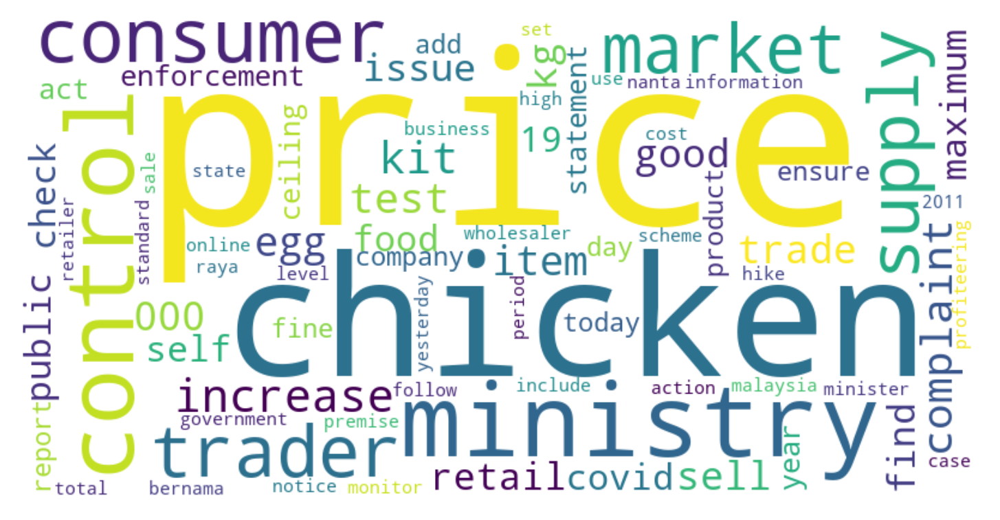

,Word,Frequency
0,price,5333
1,chicken,2141
2,ministry,1346
3,control,1156
4,consumer,1096
5,trader,992
6,supply,966
7,market,920
8,increase,892
9,kit,850


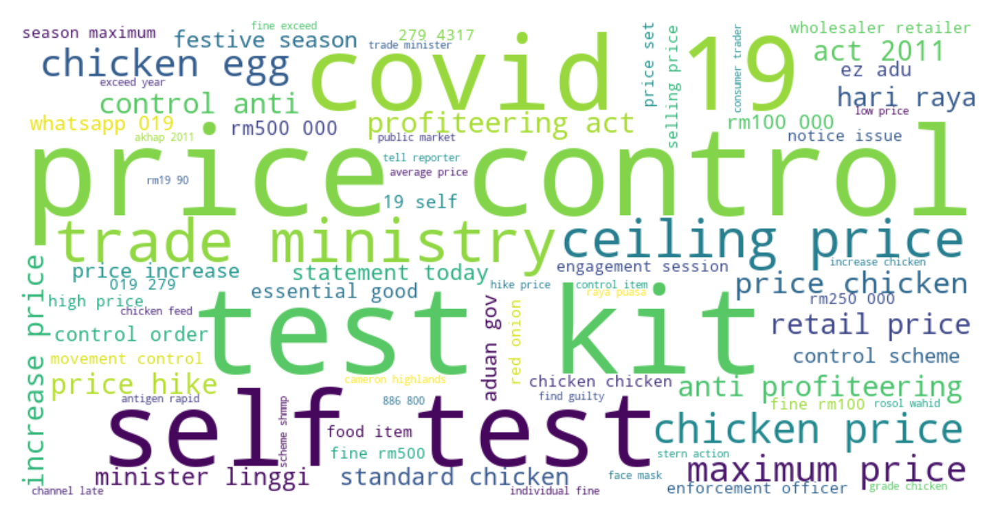

,Word,Frequency
0,price control,718
1,test kit,690
2,self test,500
3,covid 19,499
4,trade ministry,458
5,ceiling price,420
6,chicken price,378
7,chicken egg,340
8,maximum price,290
9,price chicken,268


========================topic 3=========================
TOP 20 words for topic 5
including (0.08262162299154115)  miti (0.08538820315712607)  compliance (0.0355382762933323)  permission (0.015237872683019215)  ministry (0.24857071199856193)  shops (0.0)  areas (0.04856333801275285)  mco (0.35346732093826216)  sports (0.0)  00 (0.0)  phase (0.004036061123869282)  customers (0.05238034226921961)  sop (0.11518210888636583)  sops (0.1036534877564834)  services (0.07334932795480023)  stores (0.0)  activities (0.008935069588918132)  premises (0.0)  operate (0.0)  allowed (0.0)  




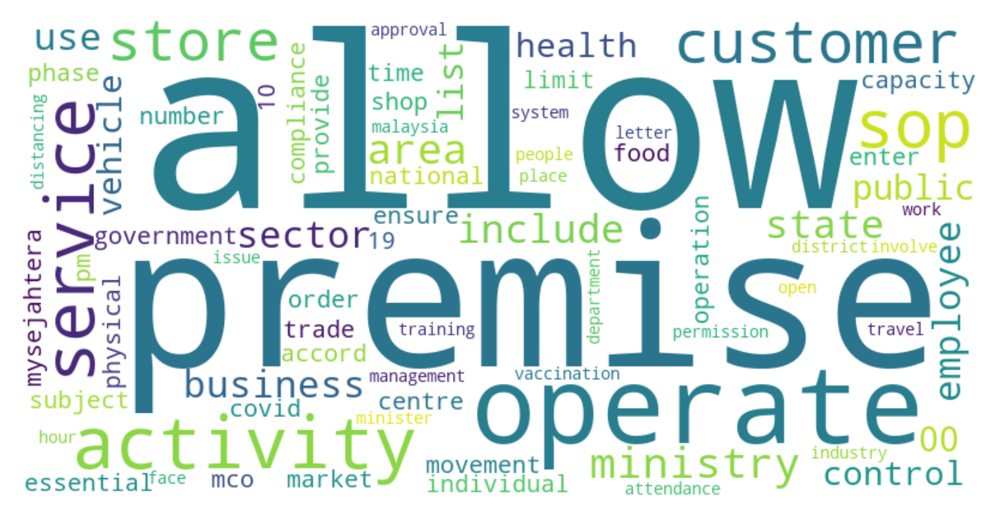

,Word,Frequency
0,allow,7409
1,premise,4733
2,operate,4030
3,activity,3874
4,service,3424
5,sop,3172
6,customer,2839
7,store,2607
8,ministry,2404
9,area,2309


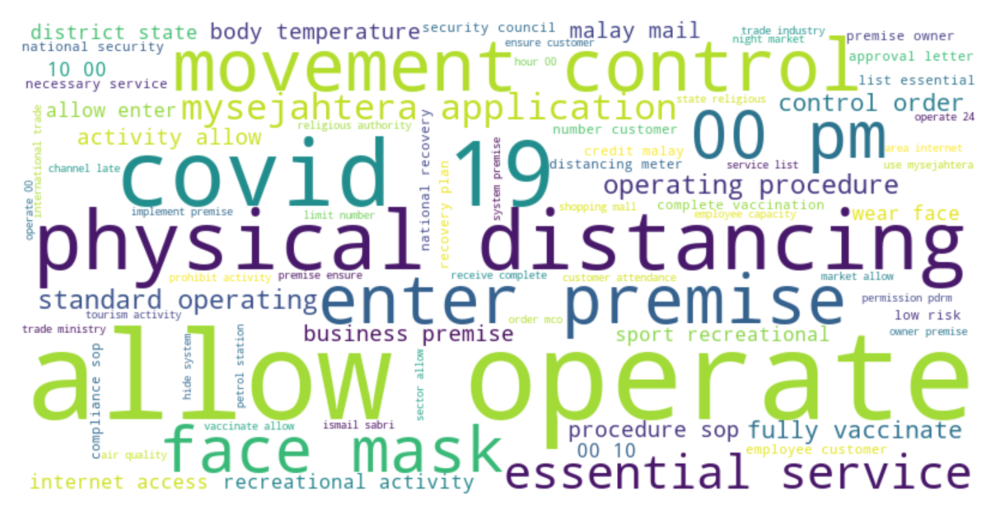

,Word,Frequency
0,allow operate,2246
1,covid 19,1123
2,physical distancing,877
3,movement control,669
4,enter premise,633
5,00 pm,620
6,face mask,576
7,essential service,568
8,mysejahtera application,537
9,standard operating,536


========================topic 4=========================
TOP 20 words for topic 5
bottles (0.0)  ministry (0.24857071199856193)  subsidy (0.0)  nanta (0.006421561233340896)  government (0.6532885692496869)  market (0.09442542709434455)  supply (0.17266542255243733)  packaging (0.0)  kpdnhep (0.14653046127279995)  rm2 (0.03888888524359583)  polybag (0.0)  bottled (0.0)  kg (0.0)  said (1.27590727798038)  palm (0.0)  1kg (0.0)  price (0.0)  subsidised (0.0)  cooking (0.0)  oil (0.0)  




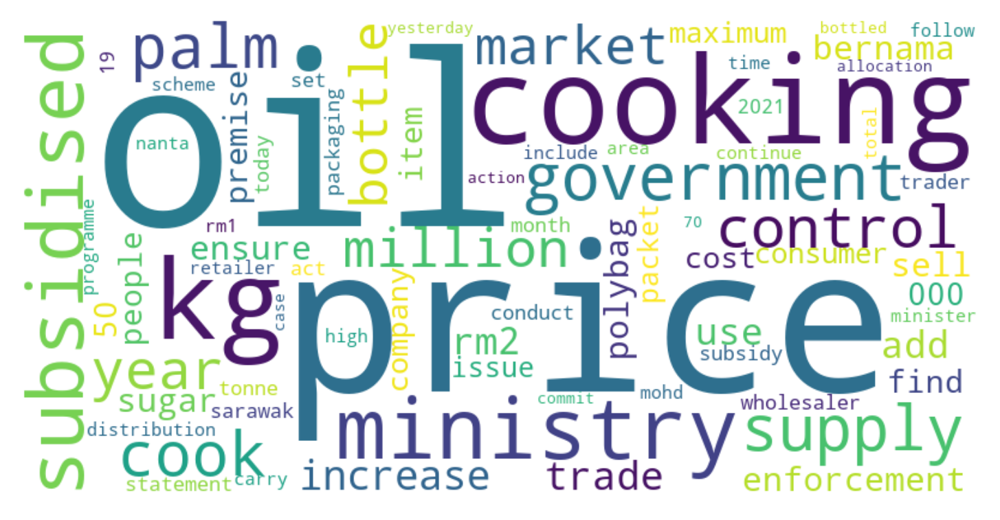

,Word,Frequency
0,oil,2230
1,price,1550
2,cooking,1500
3,kg,1220
4,ministry,640
5,subsidised,550
6,government,540
7,supply,500
8,cook,490
9,palm,490


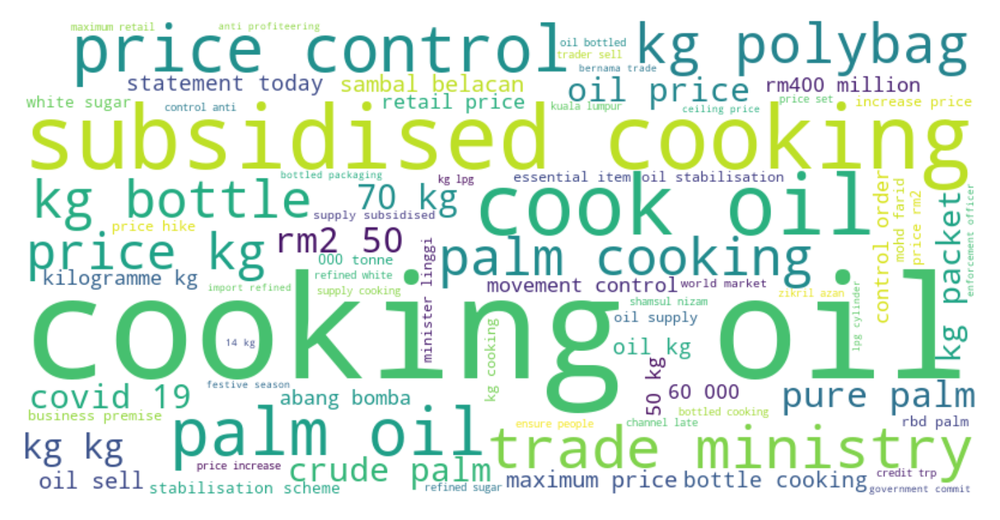

,Word,Frequency
0,cooking oil,1480
1,subsidised cooking,440
2,cook oil,390
3,palm oil,220
4,price control,210
5,trade ministry,170
6,kg polybag,150
7,kg bottle,140
8,palm cooking,140
9,rm2 50,130


========================topic 5=========================
TOP 20 words for topic 5
centres (0.0)  frontliners (0.0)  citf (0.0)  shopping (0.0)  vaccines (0.036855755460663456)  industry (0.09712278141597681)  vaccinated (0.09278741005985705)  said (1.27590727798038)  khairy (0.04663720183511633)  malls (0.0)  immunisation (0.0)  sector (0.0)  workers (0.20982028303152817)  19 (0.7653117115389465)  covid (0.7644555375946565)  vaccine (0.13183953127495082)  rivac (0.0)  retail (0.0)  programme (0.02930754257713404)  vaccination (0.0)  




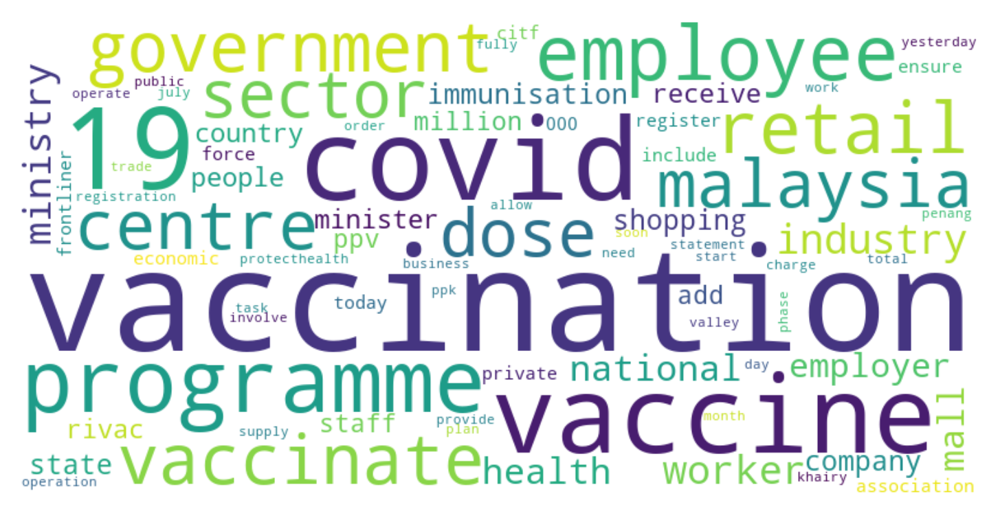

,Word,Frequency
0,vaccination,3124
1,19,1847
2,covid,1837
3,vaccine,1616
4,programme,1440
5,employee,1169
6,retail,1006
7,government,954
8,vaccinate,954
9,centre,908


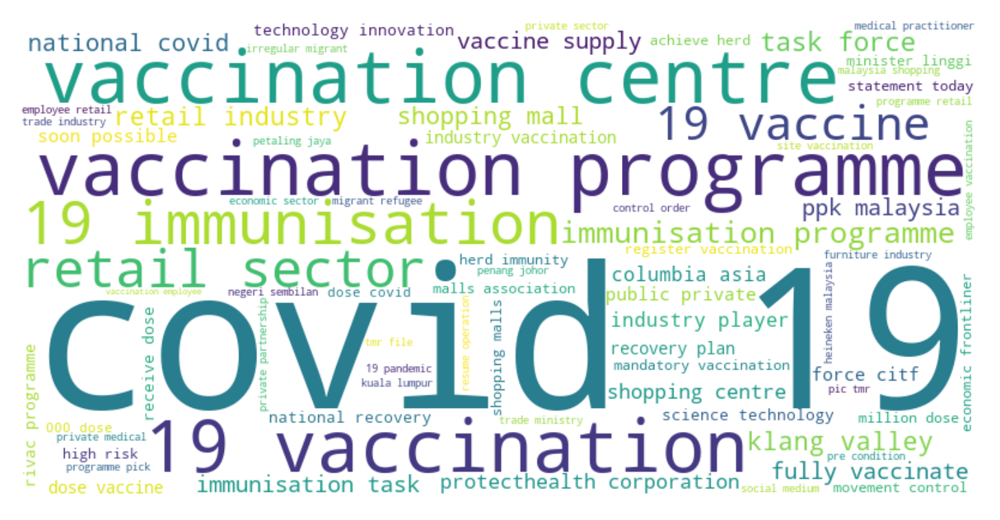

,Word,Frequency
0,covid 19,1817
1,vaccination programme,542
2,vaccination centre,527
3,19 vaccination,503
4,19 immunisation,408
5,retail sector,379
6,19 vaccine,300
7,immunisation programme,299
8,task force,229
9,retail industry,210


In [29]:
for i in range(5):
    print(f'========================topic {i+1}=========================')
    
    print(f"TOP 20 words for topic {index+1}")
    single_topic = nmf.components_[i]

    top_tens_word = single_topic.argsort()[-20:]
    top_words_text = ''
    for inx in top_tens_word:
        print(f"{tfidf_vectorizer.get_feature_names()[inx]} ({nmf.components_[0][inx]}) ", end = ' ')
        top_words_text += ' ' + cv.get_feature_names()[inx]
    print("\n\n")
    
    topic_text = " ".join(dfAll[dfAll['Topic'] == i]['text Pre'])
    draw_word_cloud_frequency_df(dfAll[dfAll['Topic'] == i]['text Pre'], 1)
    draw_word_cloud_frequency_df(dfAll[dfAll['Topic'] == i]['text Pre'], 2)
    


In [ ]:
# dfAll.to_excel("Analyse news KPDNHEP data.xlsx", index = False)

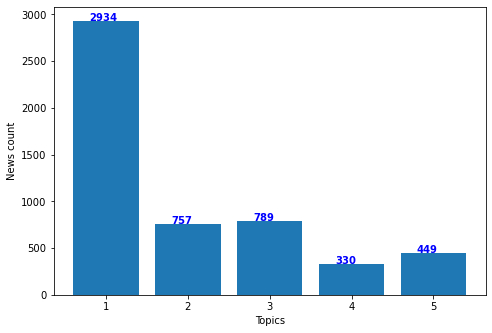

In [31]:
import matplotlib.pyplot as plt
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])

val = dfAll.Topic.value_counts().sort_index()

x = val.index + 1
y = val.values 

ax.bar(x,y)
ax.set_xticks(x)
ax.set_xlabel("Topics")
ax.set_ylabel("News count")

for i, v in enumerate(y):
    ax.text(i + 0.8 , v , str(v), color='blue', fontweight='bold')
    
plt.show()

### Topic Modelling on keywords

In [345]:
max([len(each) for each in dfAll['keyword'].values])

20

In [346]:
dfAll ["keyword combine"] =  [" ".join(each) for each in dfAll['keyword'].values]

In [355]:
def plot_top_words(model, feature_names, n_top_words, title):
    fig, axes = plt.subplots(2, 5, figsize=(30, 15), sharex=True)
    axes = axes.flatten()
    for topic_idx, topic in enumerate(model.components_):
        top_features_ind = topic.argsort()[:-n_top_words - 1:-1]
        top_features = [feature_names[i] for i in top_features_ind]
        weights = topic[top_features_ind]

        ax = axes[topic_idx]
        ax.barh(top_features, weights, height=0.7)
        ax.set_title(f'Topic {topic_idx +1}',
                     fontdict={'fontsize': 30})
        ax.invert_yaxis()
        ax.tick_params(axis='both', which='major', labelsize=20)
        for i in 'top right left'.split():
            ax.spines[i].set_visible(False)
        fig.suptitle(title, fontsize=40)

    plt.subplots_adjust(top=0.90, bottom=0.05, wspace=0.90, hspace=0.3)
    plt.show()


# Load the 20 newsgroups dataset and vectorize it. We use a few heuristics
# to filter out useless terms early on: the posts are stripped of headers,
# footers and quoted replies, and common English words, words occurring in
# only one document or in at least 95% of the documents are removed.

In [359]:
n_samples = dfAll.count()[0]
n_features = 5000
n_components = 7
n_top_words = 20

t0 = time()
print("Loading dataset...")
data_samples = dfAll ["keyword combine"] 
print("done in %0.3fs." % (time() - t0))

Loading dataset...
done in 0.000s.


In [360]:
# Use tf-idf features for NMF.
print("Extracting tf-idf features for NMF...")
tfidf_vectorizer = TfidfVectorizer(max_df=0.95, min_df=2,
                                   max_features=n_features,
                                   stop_words='english')
t0 = time()
tfidf = tfidf_vectorizer.fit_transform(data_samples)
print("done in %0.3fs." % (time() - t0))

# Use tf (raw term count) features for LDA.
print("Extracting tf features for LDA...")
tf_vectorizer = CountVectorizer(max_df=0.95, min_df=2,
                                max_features=n_features,
                                stop_words='english')
t0 = time()
tf = tf_vectorizer.fit_transform(data_samples)
print("done in %0.3fs." % (time() - t0))
print()

Extracting tf-idf features for NMF...
done in 0.303s.
Extracting tf features for LDA...
done in 0.316s.



In [361]:
# Use tf-idf features for NMF.
print("Extracting tf-idf features for NMF...")
tfidf_vectorizer = TfidfVectorizer(max_df=0.95, min_df=2,
                                   max_features=n_features,
                                   stop_words='english')
t0 = time()
tfidf = tfidf_vectorizer.fit_transform(data_samples)
print("done in %0.3fs." % (time() - t0))

# Use tf (raw term count) features for LDA.
print("Extracting tf features for LDA...")
tf_vectorizer = CountVectorizer(max_df=0.95, min_df=2,
                                max_features=n_features,
                                stop_words='english')
t0 = time()
tf = tf_vectorizer.fit_transform(data_samples)
print("done in %0.3fs." % (time() - t0))
print()

Extracting tf-idf features for NMF...
done in 0.325s.
Extracting tf features for LDA...
done in 0.249s.



Fitting the NMF model (Frobenius norm) with tf-idf features, n_samples=5259 and n_features=5000...
done in 0.789s.


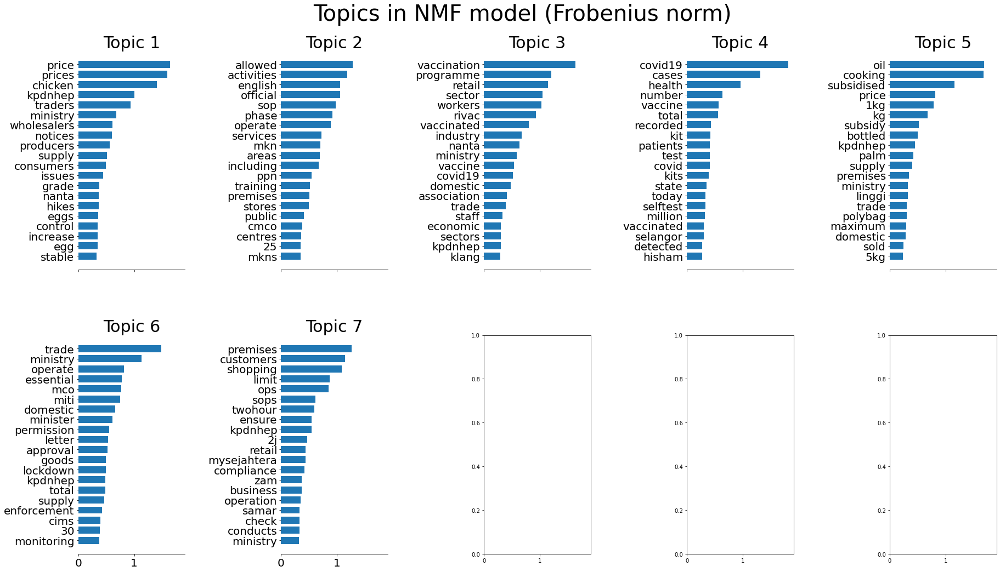

In [362]:
# Fit the NMF model
print("Fitting the NMF model (Frobenius norm) with tf-idf features, "
      "n_samples=%d and n_features=%d..."
      % (n_samples, n_features))
t0 = time()
nmf = NMF(n_components=n_components, random_state=1,
          alpha=.1, l1_ratio=.5).fit(tfidf)
print("done in %0.3fs." % (time() - t0))


tfidf_feature_names = tfidf_vectorizer.get_feature_names()
plot_top_words(nmf, tfidf_feature_names, n_top_words,
               'Topics in NMF model (Frobenius norm)')



 Fitting the NMF model (generalized Kullback-Leibler divergence) with tf-idf features, n_samples=5259 and n_features=5000...
done in 2.118s.


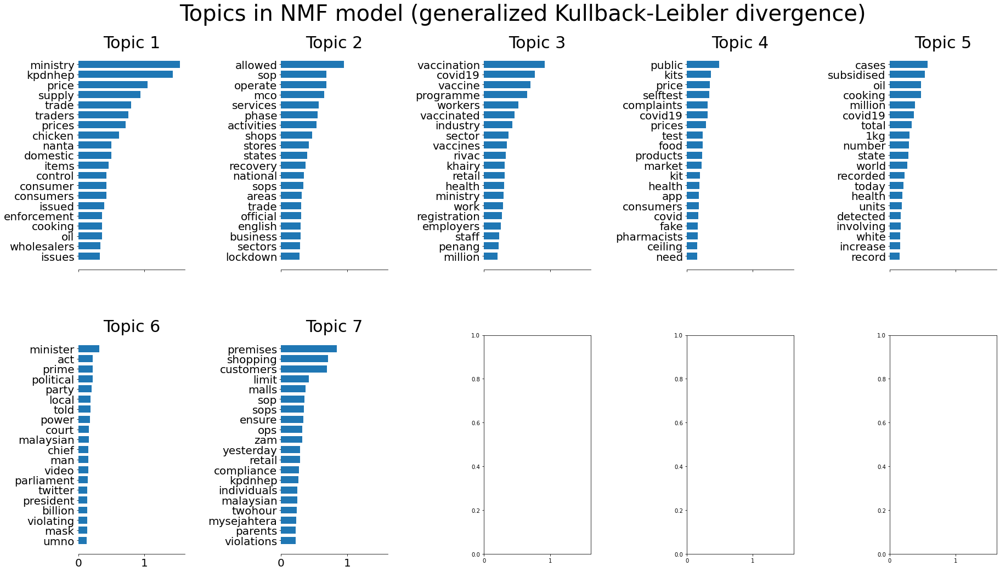

In [363]:
# Fit the NMF model
print('\n' * 2, "Fitting the NMF model (generalized Kullback-Leibler "
      "divergence) with tf-idf features, n_samples=%d and n_features=%d..."
      % (n_samples, n_features))
t0 = time()
nmf2 = NMF(n_components=n_components, random_state=1,
          beta_loss='kullback-leibler', solver='mu', max_iter=1000, alpha=.1,
          l1_ratio=.5).fit(tfidf)
print("done in %0.3fs." % (time() - t0))

tfidf_feature_names = tfidf_vectorizer.get_feature_names()
plot_top_words(nmf2, tfidf_feature_names, n_top_words,
               'Topics in NMF model (generalized Kullback-Leibler divergence)')



 Fitting LDA models with tf features, n_samples=5259 and n_features=5000...
done in 16.321s.


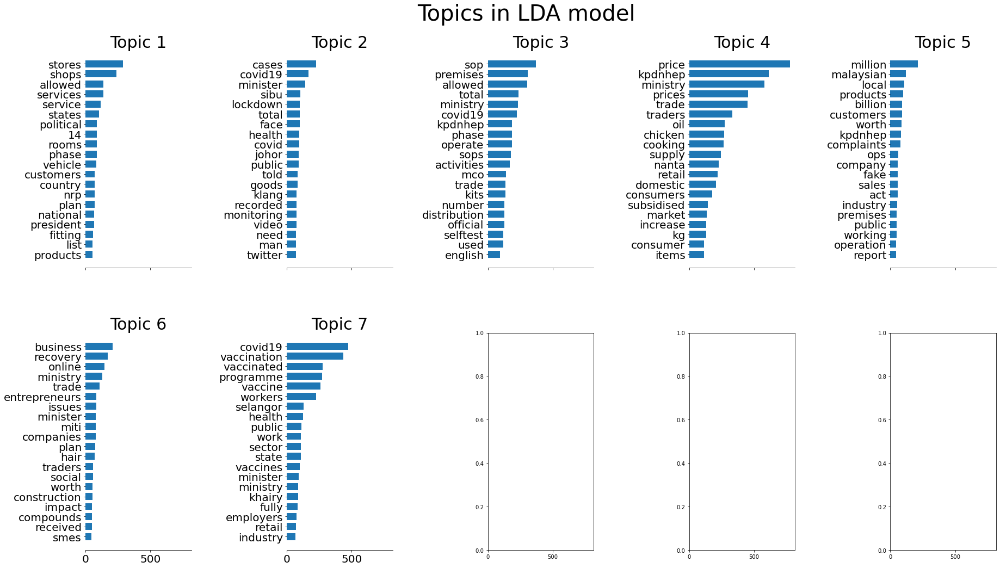

In [364]:
# Fit the LDA model
print('\n' * 2, "Fitting LDA models with tf features, "
      "n_samples=%d and n_features=%d..."
      % (n_samples, n_features))
lda = LatentDirichletAllocation(n_components=n_components, max_iter=5,
                                learning_method='online',
                                learning_offset=50.,
                                random_state=0)
t0 = time()
lda.fit(tf)
print("done in %0.3fs." % (time() - t0))

tf_feature_names = tf_vectorizer.get_feature_names()
plot_top_words(lda, tf_feature_names, n_top_words, 'Topics in LDA model')

========================topic 1=========================
TOP 20 words for topic 5
stable (0.32330099526730527)  egg (0.34560718688229247)  increase (0.3500784404783249)  control (0.350293552425457)  eggs (0.36079378144248936)  hikes (0.3627239357864304)  nanta (0.3687080231717177)  grade (0.3766563719758178)  issues (0.4411105787235462)  consumers (0.4912437692192547)  supply (0.511272441821462)  producers (0.5607636373338066)  notices (0.6006123039253336)  wholesalers (0.610589594385177)  ministry (0.6836851270918018)  traders (0.940031571411627)  kpdnhep (1.0026362941804117)  chicken (1.4095118817414223)  prices (1.5887444790834722)  price (1.6441512472089643)  




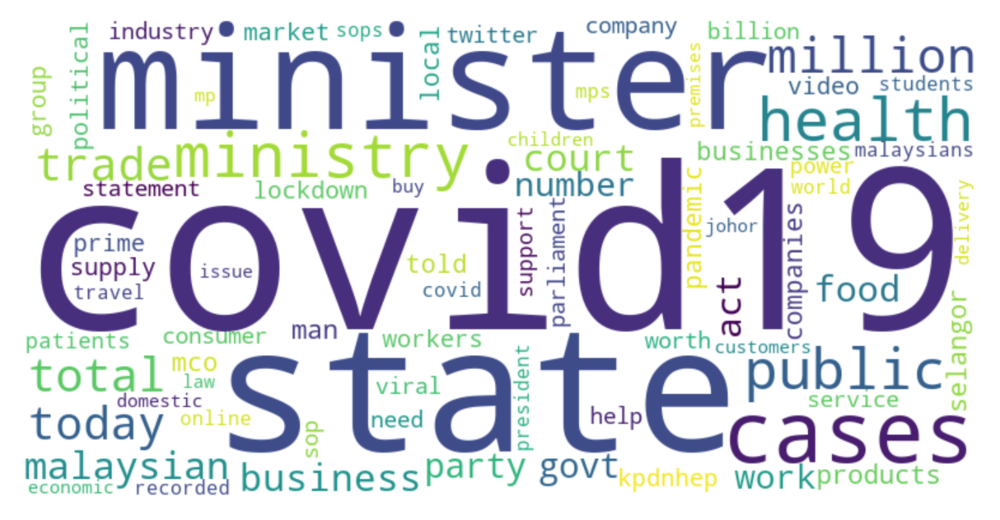

,Word,Frequency
0,covid19,467
1,state,267
2,minister,241
3,cases,219
4,ministry,213
5,health,207
6,public,200
7,million,198
8,total,180
9,today,169


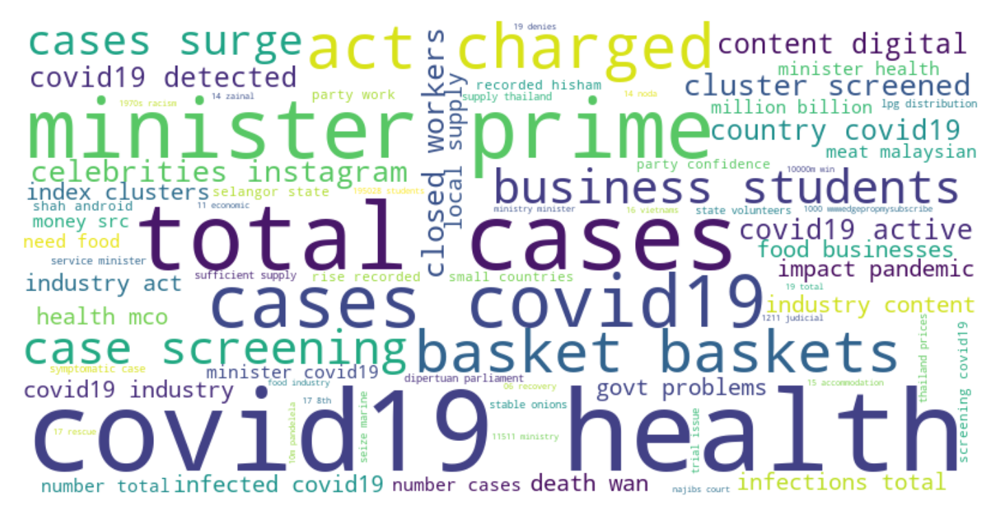

,Word,Frequency
0,covid19 health,79
1,total cases,50
2,minister prime,39
3,cases covid19,29
4,index clusters,20
5,industry content,20
6,industry act,20
7,closed workers,20
8,case screening,20
9,minister health,20


========================topic 2=========================
TOP 20 words for topic 5
mkns (0.0)  25 (0.0)  centres (0.0)  cmco (0.0)  public (0.2514250217877501)  stores (0.0)  premises (0.018067316194761162)  training (0.0)  ppn (0.0)  including (0.0)  areas (0.0)  mkn (0.0)  services (0.0)  operate (0.0)  phase (0.0)  sop (0.0)  official (0.03617642353169613)  english (0.0)  activities (0.0)  allowed (0.0)  




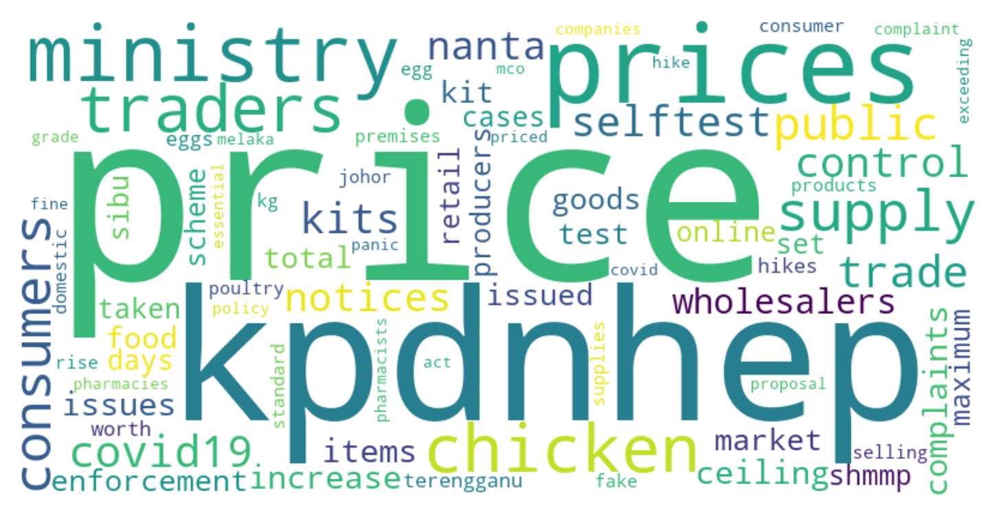

,Word,Frequency
0,price,519
1,kpdnhep,368
2,prices,328
3,ministry,310
4,chicken,229
5,traders,218
6,supply,159
7,consumers,140
8,public,109
9,covid19,100


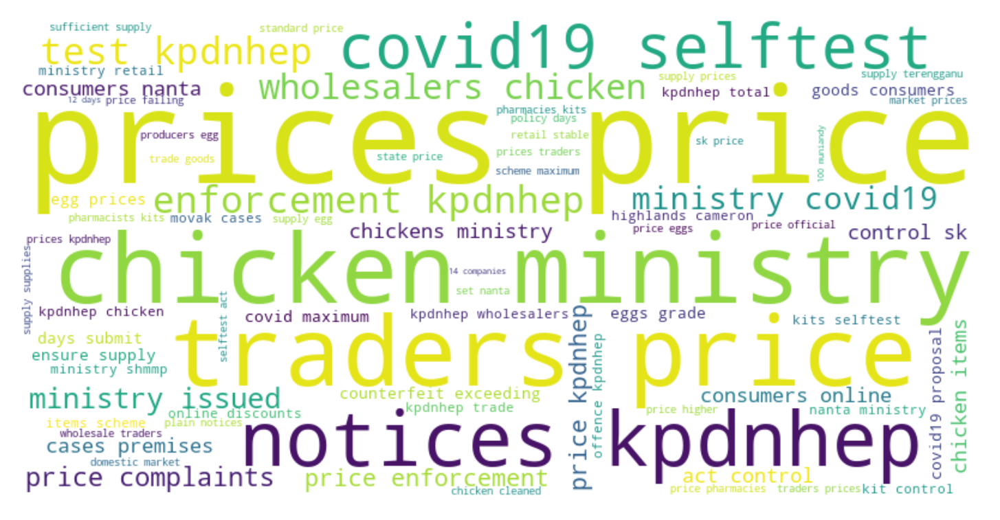

,Word,Frequency
0,prices price,110
1,traders price,50
2,chicken ministry,50
3,notices kpdnhep,49
4,enforcement kpdnhep,40
5,covid19 selftest,40
6,test kpdnhep,40
7,wholesalers chicken,39
8,price kpdnhep,30
9,price complaints,30


========================topic 3=========================
TOP 20 words for topic 5
klang (0.0)  kpdnhep (1.0026362941804117)  sectors (0.0)  economic (0.0)  staff (0.0)  trade (0.0)  association (0.0)  domestic (0.0)  covid19 (0.0)  vaccine (0.0)  ministry (0.6836851270918018)  nanta (0.3687080231717177)  industry (0.0)  vaccinated (0.0)  rivac (0.0)  workers (0.0)  sector (0.0)  retail (0.29209128978441984)  programme (0.0)  vaccination (0.0)  




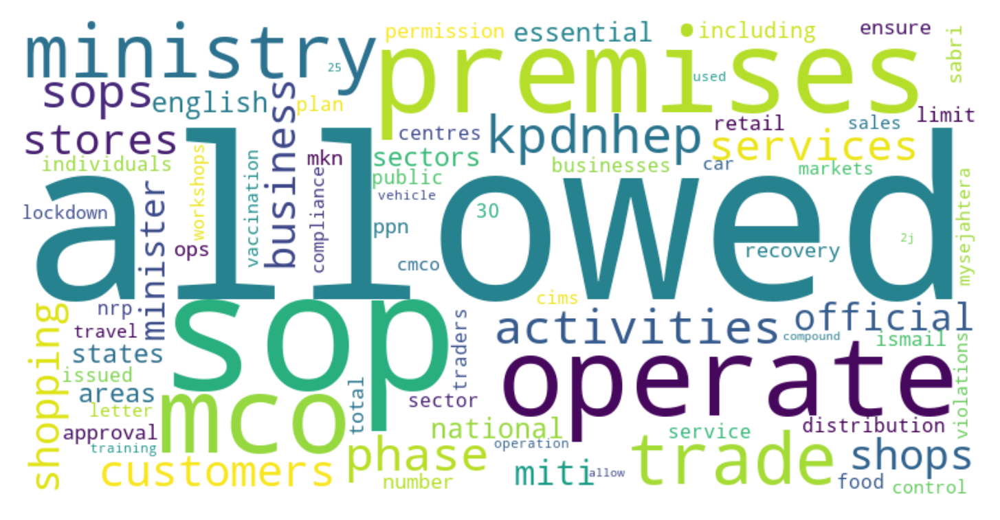

,Word,Frequency
0,allowed,359
1,sop,289
2,premises,269
3,operate,239
4,mco,230
5,ministry,230
6,trade,210
7,kpdnhep,179
8,sops,150
9,phase,149


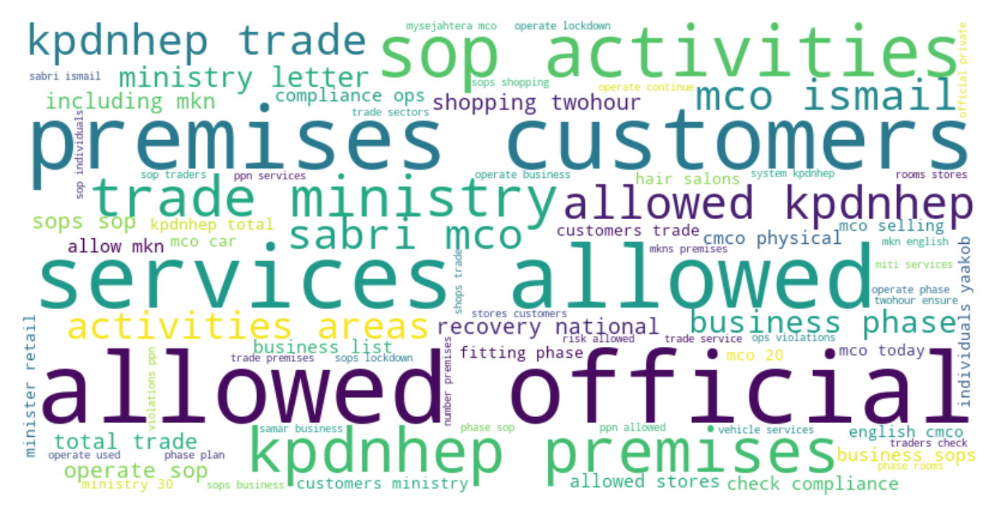

,Word,Frequency
0,allowed official,79
1,services allowed,69
2,premises customers,69
3,sop activities,69
4,kpdnhep premises,60
5,trade ministry,50
6,mco ismail,40
7,sabri mco,40
8,kpdnhep trade,40
9,allowed kpdnhep,40


========================topic 4=========================
TOP 20 words for topic 5
hisham (0.0)  detected (0.0)  selangor (0.047781875321154)  vaccinated (0.0)  million (0.0)  selftest (0.2576473419598461)  today (0.07957804213747623)  state (0.061786358318873136)  kits (0.24961465217778508)  covid (0.09555420154464458)  test (0.11688681814921213)  patients (0.0)  kit (0.16805941819172612)  recorded (0.0)  total (0.0)  vaccine (0.0)  number (0.0)  health (0.0)  cases (0.0)  covid19 (0.0)  




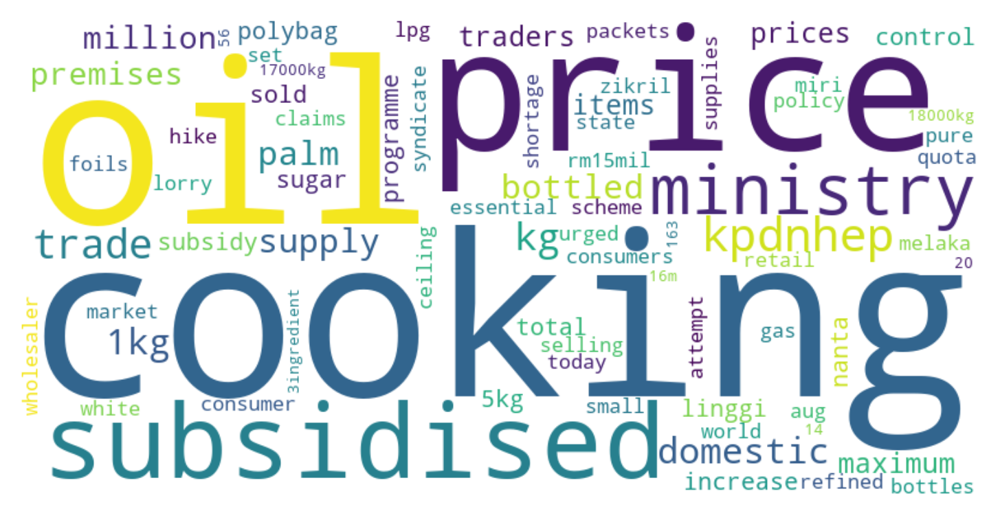

,Word,Frequency
0,oil,290
1,cooking,290
2,price,180
3,subsidised,150
4,ministry,140
5,kpdnhep,120
6,trade,90
7,kg,80
8,1kg,70
9,domestic,70


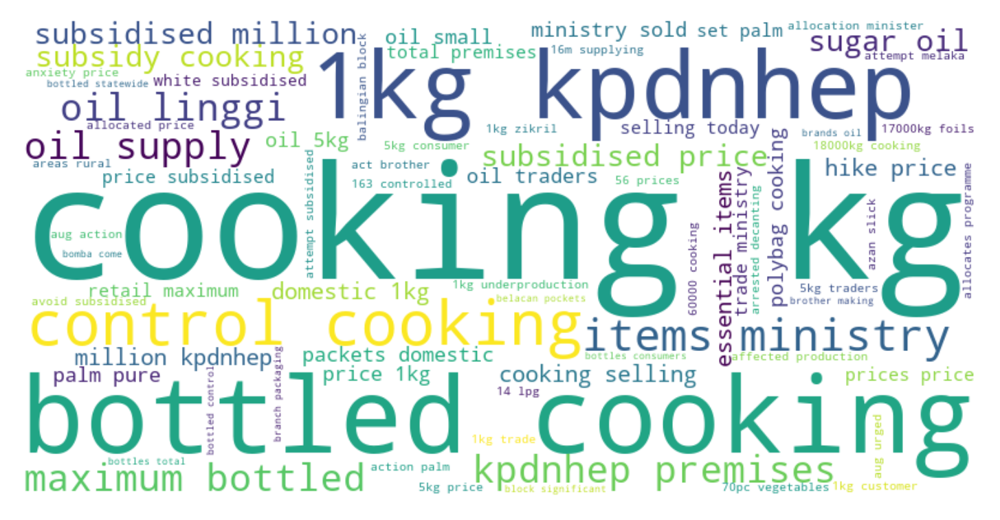

,Word,Frequency
0,cooking kg,60
1,bottled cooking,40
2,subsidised million,30
3,control cooking,30
4,subsidised price,30
5,kpdnhep premises,30
6,subsidy cooking,30
7,1kg kpdnhep,30
8,sugar oil,30
9,oil linggi,30


========================topic 5=========================
TOP 20 words for topic 5
5kg (0.020590269500820407)  sold (0.1185022033278626)  domestic (0.0)  maximum (0.27880356716121396)  polybag (0.006530597098335252)  trade (0.0)  linggi (0.07656927921422678)  ministry (0.6836851270918018)  premises (0.018067316194761162)  supply (0.511272441821462)  palm (0.03622281263370214)  kpdnhep (1.0026362941804117)  bottled (0.04196461776099625)  subsidy (0.029555978134340133)  kg (0.13764833722564754)  1kg (0.0)  price (1.6441512472089643)  subsidised (0.0)  cooking (0.0)  oil (0.0)  




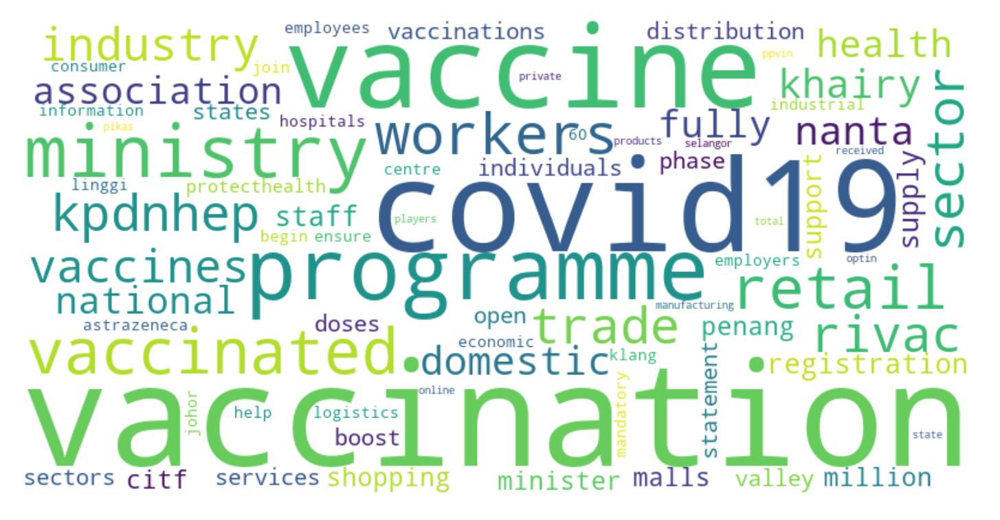

,Word,Frequency
0,vaccination,328
1,covid19,258
2,vaccine,209
3,programme,199
4,ministry,140
5,vaccinated,131
6,retail,120
7,workers,110
8,sector,90
9,trade,80


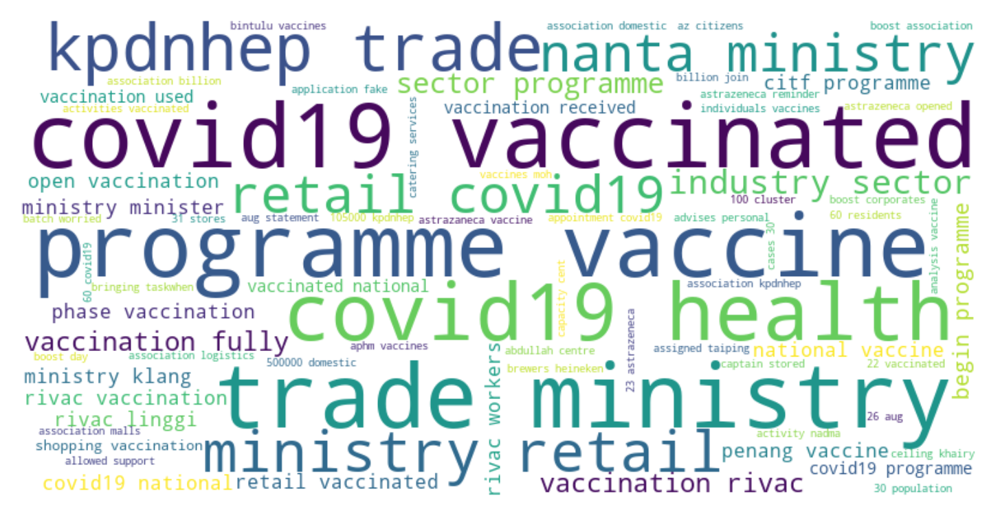

,Word,Frequency
0,covid19 vaccinated,50
1,trade ministry,50
2,programme vaccine,49
3,ministry retail,40
4,retail covid19,40
5,covid19 health,40
6,kpdnhep trade,40
7,nanta ministry,40
8,sector programme,30
9,vaccination fully,30


========================topic 6=========================
TOP 20 words for topic 5
monitoring (0.0)  30 (0.0)  cims (0.0)  enforcement (0.21035645267225003)  supply (0.511272441821462)  total (0.0)  kpdnhep (1.0026362941804117)  lockdown (0.0)  goods (0.12744281590820897)  approval (0.0)  letter (0.0)  permission (0.0)  minister (0.0)  domestic (0.0)  miti (0.0)  mco (0.0)  essential (0.0)  operate (0.0)  ministry (0.6836851270918018)  trade (0.0)  




ValueError: empty vocabulary; perhaps the documents only contain stop words

In [367]:
for i in range(7):
    print(f'========================topic {i+1}=========================')
    
    print(f"TOP 20 words for topic {index+1}")
    single_topic = nmf.components_[i]

    top_tens_word = single_topic.argsort()[-20:]
    top_words_text = ''
    for inx in top_tens_word:
        print(f"{tfidf_vectorizer.get_feature_names()[inx]} ({nmf.components_[0][inx]}) ", end = ' ')
        top_words_text += ' ' + tfidf_vectorizer.get_feature_names()[inx]
    print("\n\n")
    
    topic_text = " ".join(dfAll[dfAll['Topic'] == i]['text Pre'])
    draw_word_cloud_frequency_df(dfAll[dfAll['Topic'] == i]['keyword combine'], 1)
    draw_word_cloud_frequency_df(dfAll[dfAll['Topic'] == i]['keyword combine'], 2)

    
